In [3]:
import numpy as np
import pandas as pd
import datetime
import scipy.optimize as sco
from scipy import stats
import matplotlib.pyplot as plt
tickers = ['AAPL', 'MSFT', 'NFLX', 'AMZN', 'GOOG']
df = pd.read_csv("./20091231-20220422-AdjClose_AaplMsftNflxAmznGoog.csv", index_col=0)
print(df)

                  AAPL        MSFT        NFLX         AMZN         GOOG
Date                                                                    
2009-12-31    6.444381   23.493395    7.870000   134.520004   308.832428
2010-01-04    6.544688   23.855656    7.640000   133.899994   312.204773
2010-01-05    6.556003   23.863361    7.358571   134.690002   310.829926
2010-01-06    6.451721   23.716917    7.617143   132.250000   302.994293
2010-01-07    6.439794   23.470266    7.485714   130.000000   295.940735
...                ...         ...         ...          ...          ...
2022-04-18  165.070007  280.519989  337.859985  3055.699951  2559.219971
2022-04-19  167.399994  285.299988  348.609985  3162.310059  2610.620117
2022-04-20  167.229996  286.359985  226.190002  3079.959961  2564.909912
2022-04-21  166.419998  280.809998  218.220001  2965.919922  2498.750000
2022-04-22  161.789993  274.029999  215.520004  2887.000000  2392.280029

[3099 rows x 5 columns]


In [4]:
def calc_portfolio_perf(weights, mean_returns, cov, rf):
    portfolio_return = np.sum(mean_returns * weights) * 252
    portfolio_std = np.sqrt(np.dot(weights.T, np.dot(cov, weights))) * np.sqrt(252)
    sharpe_ratio = (portfolio_return - rf) / portfolio_std
    return portfolio_return, portfolio_std, sharpe_ratio
def simulate_random_portfolios(num_portfolios, mean_returns, cov, rf):
    results_matrix = np.zeros((len(mean_returns)+3, num_portfolios))
    for i in range(num_portfolios):
        weights = np.random.random(len(mean_returns))
        weights /= np.sum(weights)
        portfolio_return, portfolio_std, sharpe_ratio = calc_portfolio_perf(weights, mean_returns, cov, rf)
        results_matrix[0,i] = portfolio_return
        results_matrix[1,i] = portfolio_std
        results_matrix[2,i] = sharpe_ratio
        #iterate through the weight vector and add data to results array
        for j in range(len(weights)):
            results_matrix[j+3,i] = weights[j]
    results_df = pd.DataFrame(results_matrix.T,columns=['ret','stdev','sharpe'] + [ticker for ticker in tickers])
    return results_df

In [5]:
mean_returns = df.pct_change().mean()
cov = df.pct_change().cov()
num_portfolios = 100000
rf = 0.0
results_frame = simulate_random_portfolios(num_portfolios, mean_returns, cov, rf)
print(results_frame.to_markdown())

|       |      ret |    stdev |   sharpe |        AAPL |        MSFT |        NFLX |        AMZN |        GOOG |
|------:|---------:|---------:|---------:|------------:|------------:|------------:|------------:|------------:|
|     0 | 0.308552 | 0.278958 | 1.10609  | 0.125852    | 0.00189506  | 0.305837    | 0.33578     | 0.230635    |
|     1 | 0.281544 | 0.231607 | 1.21561  | 0.370771    | 0.425438    | 0.106338    | 0.0867838   | 0.0106695   |
|     2 | 0.289855 | 0.259354 | 1.1176   | 0.127342    | 0.0112503   | 0.124239    | 0.514793    | 0.222375    |
|     3 | 0.289756 | 0.250297 | 1.15765  | 0.200049    | 0.12185     | 0.24212     | 0.162437    | 0.273545    |
|     4 | 0.295519 | 0.247557 | 1.19374  | 0.311596    | 0.0441018   | 0.211171    | 0.194579    | 0.238552    |
|     5 | 0.284177 | 0.247131 | 1.1499   | 0.0560592   | 0.361877    | 0.168873    | 0.32764     | 0.0855496   |
|     6 | 0.294776 | 0.265536 | 1.11012  | 0.0369421   | 0.276972    | 0.288976    | 0.234937   

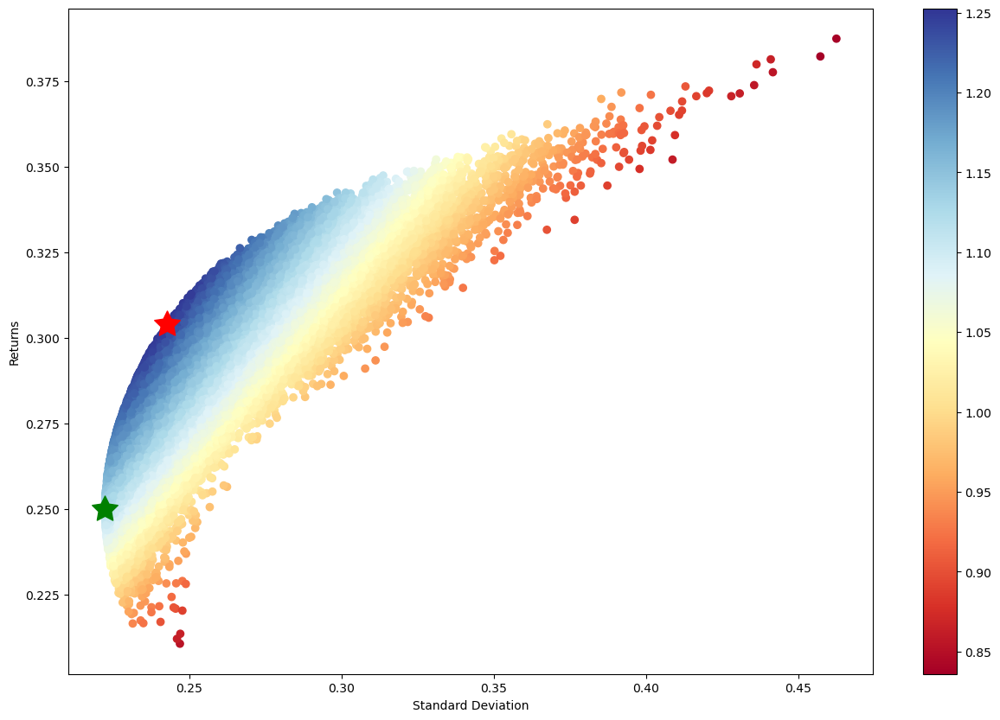

In [6]:
#locate position of portfolio with highest Sharpe Ratio
max_sharpe_port = results_frame.iloc[results_frame['sharpe'].idxmax()]
#locate positon of portfolio with minimum standard deviation
min_vol_port = results_frame.iloc[results_frame['stdev'].idxmin()]
#create scatter plot coloured by Sharpe Ratio
plt.subplots(figsize=(15,10))
plt.scatter(results_frame.stdev,results_frame.ret,c=results_frame.sharpe,cmap='RdYlBu')
plt.xlabel('Standard Deviation')
plt.ylabel('Returns')
plt.colorbar()
#plot red star to highlight position of portfolio with highest Sharpe Ratio
plt.scatter(max_sharpe_port[1],max_sharpe_port[0],marker=(5,1,0),color='r',s=500)
#plot green star to highlight position of minimum variance portfolio
plt.scatter(min_vol_port[1],min_vol_port[0],marker=(5,1,0),color='g',s=500)
plt.show()

In [7]:
print(max_sharpe_port.to_frame().T.to_markdown(index=False))
print(min_vol_port.to_frame().T.to_markdown(index=False))

|      ret |    stdev |   sharpe |     AAPL |     MSFT |     NFLX |    AMZN |        GOOG |
|---------:|---------:|---------:|---------:|---------:|---------:|--------:|------------:|
| 0.303942 | 0.242624 |  1.25273 | 0.450154 | 0.165854 | 0.141777 | 0.24152 | 0.000695955 |
|      ret |    stdev |   sharpe |     AAPL |     MSFT |      NFLX |     AMZN |     GOOG |
|---------:|---------:|---------:|---------:|---------:|----------:|---------:|---------:|
| 0.249861 | 0.222262 |  1.12418 | 0.237223 | 0.348429 | 0.0232423 | 0.098198 | 0.292908 |


In [8]:
def calc_neg_sharpe(weights, mean_returns, cov, rf):
    portfolio_return = np.sum(mean_returns * weights) * 252
    portfolio_std = np.sqrt(np.dot(weights.T, np.dot(cov, weights))) * np.sqrt(252)
    sharpe_ratio = (portfolio_return - rf) / portfolio_std
    return -sharpe_ratio
constraints = ({'type': 'eq', 'fun': lambda x: np.sum(x) - 1})
def max_sharpe_ratio(mean_returns, cov, rf):
    num_assets = len(mean_returns)
    args = (mean_returns, cov, rf)
    constraints = ({'type': 'eq', 'fun': lambda x: np.sum(x) - 1})
    bound = (0.0,1.0)
    bounds = tuple(bound for asset in range(num_assets))
    result = sco.minimize(calc_neg_sharpe, num_assets*[1./num_assets,], args=args,
                        method='SLSQP', bounds=bounds, constraints=constraints)
    return result
optimal_port_sharpe = max_sharpe_ratio(mean_returns, cov, rf)
print(pd.DataFrame([round(x,2) for x in optimal_port_sharpe['x']],index=tickers).T.to_markdown(index=False))

|   AAPL |   MSFT |   NFLX |   AMZN |   GOOG |
|-------:|-------:|-------:|-------:|-------:|
|   0.48 |   0.16 |   0.15 |   0.22 |      0 |


In [9]:
def calc_portfolio_std(weights, mean_returns, cov):
    portfolio_std = np.sqrt(np.dot(weights.T, np.dot(cov, weights))) * np.sqrt(252)
    return portfolio_std
def min_variance(mean_returns, cov):
    num_assets = len(mean_returns)
    args = (mean_returns, cov)
    constraints = ({'type': 'eq', 'fun': lambda x: np.sum(x) - 1})
    bound = (0.0,1.0)
    bounds = tuple(bound for asset in range(num_assets))
    result = sco.minimize(calc_portfolio_std, num_assets*[1./num_assets,],args=args,method='SLSQP', bounds=bounds, constraints=constraints)
    return result
min_port_variance = min_variance(mean_returns, cov)
print(pd.DataFrame([round(x,2) for x in min_port_variance['x']],index=tickers).T.to_markdown(index=False))

|   AAPL |   MSFT |   NFLX |   AMZN |   GOOG |
|-------:|-------:|-------:|-------:|-------:|
|   0.24 |   0.36 |   0.02 |   0.08 |    0.3 |


In [10]:
'''
st.norm中的子模块
pdf:概率密度函数
cdf:累计概率分布函数
ppf:分位点函数,cdf的反函数
'''
def calc_portfolio_perf_VaR(weights, mean_returns, cov, alpha, days):
    portfolio_return = np.sum(mean_returns * weights) * days
    portfolio_std = np.sqrt(np.dot(weights.T, np.dot(cov, weights))) * np.sqrt(days)
    portfolio_var = abs(portfolio_return - (portfolio_std * stats.norm.ppf(1 -alpha)))
    return portfolio_return, portfolio_std, portfolio_var
def simulate_random_portfolios_VaR(num_portfolios, mean_returns, cov, alpha, days):
    results_matrix = np.zeros((len(mean_returns)+3, num_portfolios))
    for i in range(num_portfolios):
        weights = np.random.random(len(mean_returns))
        weights /= np.sum(weights)
        portfolio_return, portfolio_std, portfolio_VaR = calc_portfolio_perf_VaR(weights, mean_returns, cov, alpha, days)
        results_matrix[0,i] = portfolio_return
        results_matrix[1,i] = portfolio_std
        results_matrix[2,i] = portfolio_VaR
        #iterate through the weight vector and add data to results array
        for j in range(len(weights)):
            results_matrix[j+3,i] = weights[j]
    results_df = pd.DataFrame(results_matrix.T,columns=['ret','stdev','VaR'] + [ticker for ticker in tickers])
    return results_df

In [11]:
mean_returns = df.pct_change().mean()
cov = df.pct_change().cov()
num_portfolios = 100000
rf = 0.0
days = 252
alphas =[0.05, 0.025, 0.01] # 显著度水平

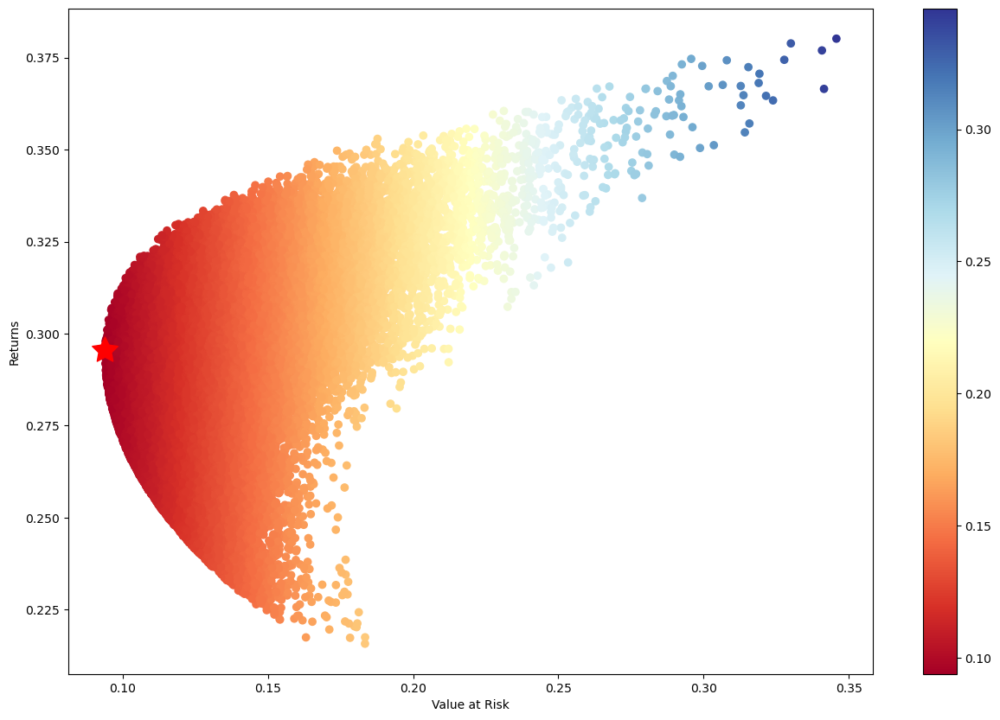

|      ret |    stdev |       VaR |     AAPL |    MSFT |     NFLX |     AMZN |      GOOG |
|---------:|---------:|----------:|---------:|--------:|---------:|---------:|----------:|
| 0.295456 | 0.236724 | 0.0939192 | 0.440269 | 0.21936 | 0.122761 | 0.187904 | 0.0297048 |


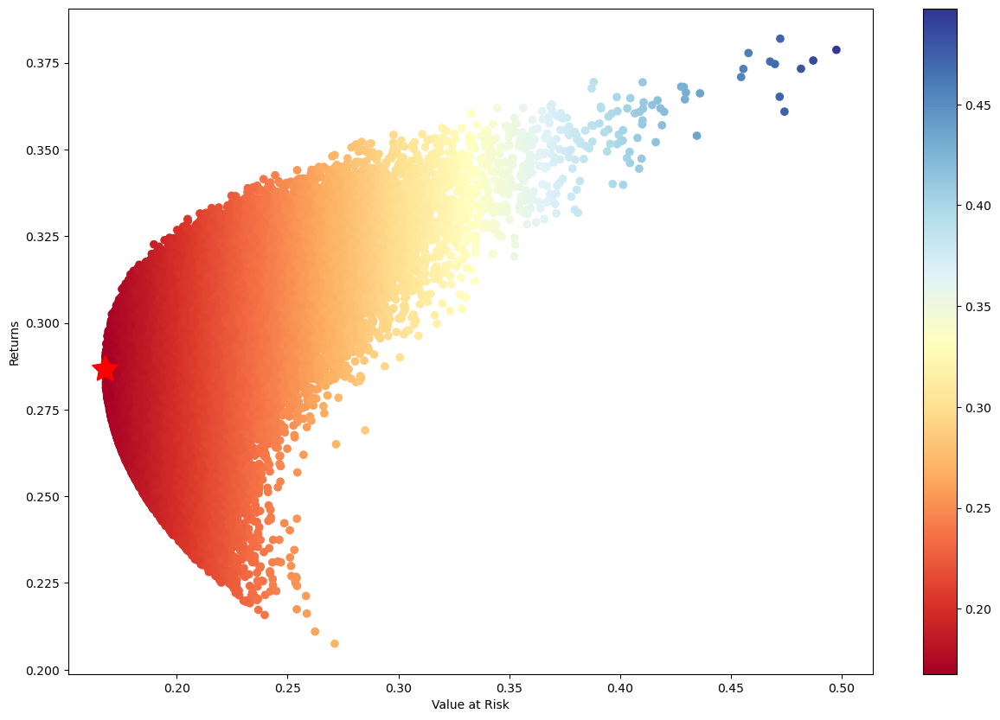

|      ret |    stdev |      VaR |     AAPL |     MSFT |     NFLX |     AMZN |      GOOG |
|---------:|---------:|---------:|---------:|---------:|---------:|---------:|----------:|
| 0.286794 | 0.231861 | 0.167646 | 0.396722 | 0.258396 | 0.105233 | 0.168523 | 0.0711273 |


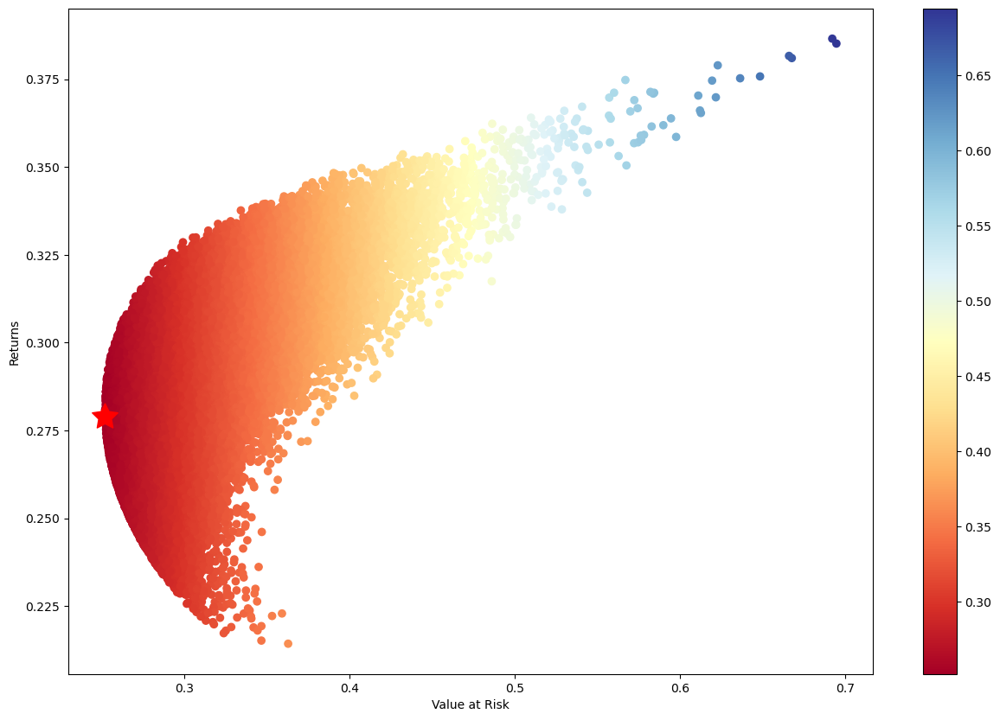

|      ret |    stdev |      VaR |     AAPL |    MSFT |      NFLX |     AMZN |     GOOG |
|---------:|---------:|---------:|---------:|--------:|----------:|---------:|---------:|
| 0.279048 | 0.228318 | 0.252098 | 0.361408 | 0.28822 | 0.0841523 | 0.160178 | 0.106043 |


In [12]:
for alpha in alphas:
    results_frame = simulate_random_portfolios_VaR(num_portfolios, mean_returns, cov, alpha, days)
    #locate positon of portfolio with minimum VaR
    min_VaR_port = results_frame.iloc[results_frame['VaR'].idxmin()]
    #create scatter plot coloured by VaR
    plt.subplots(figsize=(15,10))
    plt.scatter(results_frame.VaR,results_frame.ret,c=results_frame.VaR,cmap='RdYlBu')
    plt.xlabel('Value at Risk')
    plt.ylabel('Returns')
    plt.colorbar()
    #plot red star to highlight position of minimum VaR portfolio
    plt.scatter(min_VaR_port[2],min_VaR_port[0],marker=(5,1,0),color='r',s=500)
    plt.show()
    print(min_VaR_port.to_frame().T.to_markdown(index=False))

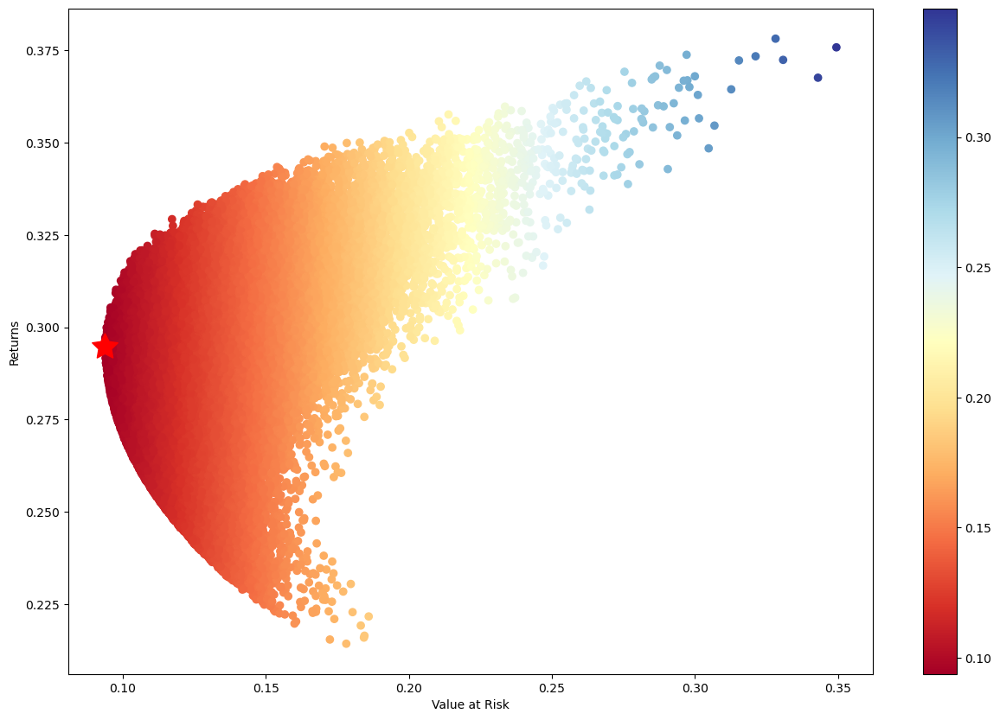

|     ret |    stdev |       VaR |     AAPL |     MSFT |     NFLX |     AMZN |       GOOG |
|--------:|---------:|----------:|---------:|---------:|---------:|---------:|-----------:|
| 0.29476 | 0.236211 | 0.0937732 | 0.426893 | 0.257941 | 0.114813 | 0.198629 | 0.00172427 |


In [13]:
alpha = 0.05 # 显著度水平
results_frame = simulate_random_portfolios_VaR(num_portfolios, mean_returns, cov, alpha, days)
#locate positon of portfolio with minimum VaR
min_VaR_port = results_frame.iloc[results_frame['VaR'].idxmin()]
#create scatter plot coloured by VaR
plt.subplots(figsize=(15,10))
plt.scatter(results_frame.VaR,results_frame.ret,c=results_frame.VaR,cmap='RdYlBu')
plt.xlabel('Value at Risk')
plt.ylabel('Returns')
plt.colorbar()
#plot red star to highlight position of minimum VaR portfolio
plt.scatter(min_VaR_port[2],min_VaR_port[0],marker=(5,1,0),color='r',s=500)
plt.show()
print(min_VaR_port.to_frame().T.to_markdown(index=False))

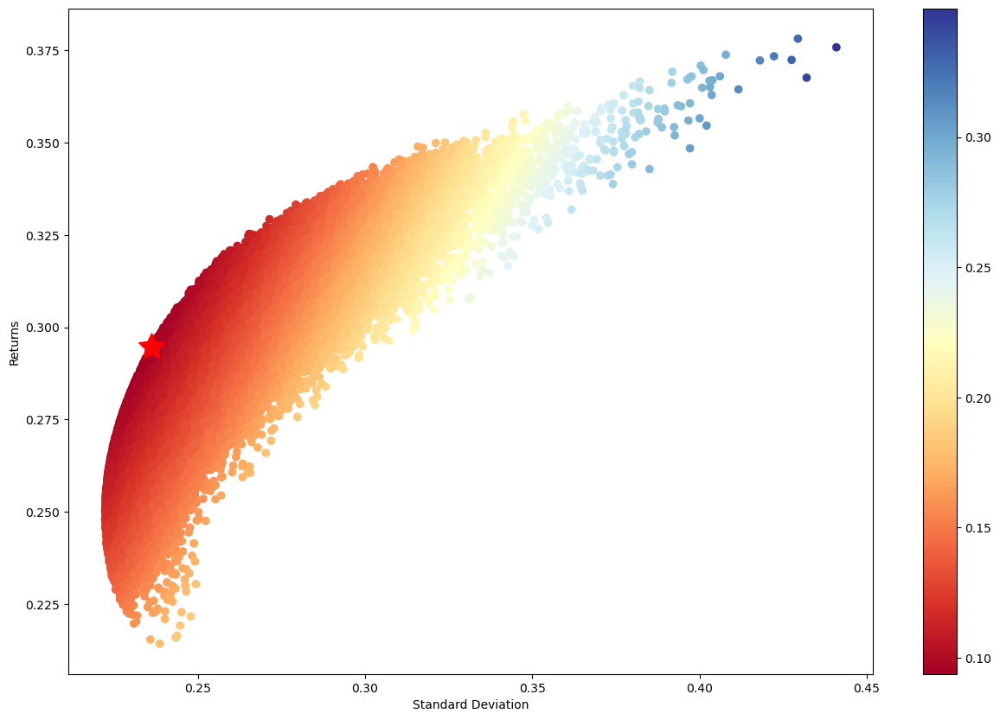

In [14]:
#locate positon of portfolio with minimum VaR
min_VaR_port = results_frame.iloc[results_frame['VaR'].idxmin()]
#create scatter plot coloured by VaR
plt.subplots(figsize=(15,10))
plt.scatter(results_frame.stdev,results_frame.ret,c=results_frame.VaR,cmap='RdYlBu')
plt.xlabel('Standard Deviation')
plt.ylabel('Returns')
plt.colorbar()
#plot red star to highlight position of minimum VaR portfolio
plt.scatter(min_VaR_port[1],min_VaR_port[0],marker=(5,1,0),color='r',s=500)
plt.show()

In [15]:
constraints = ({'type': 'eq', 'fun': lambda x: np.sum(x) - 1})
def calc_portfolio_VaR(weights, mean_returns, cov, alpha, days):
    portfolio_return = np.sum(mean_returns * weights) * days
    portfolio_std = np.sqrt(np.dot(weights.T, np.dot(cov, weights))) * np.sqrt(days)
    portfolio_var = abs(portfolio_return - (portfolio_std * stats.norm.ppf(1 - alpha)))
    return portfolio_var
def min_VaR(mean_returns, cov, alpha, days):
    num_assets = len(mean_returns)
    args = (mean_returns, cov, alpha, days)
    constraints = ({'type': 'eq', 'fun': lambda x: np.sum(x) - 1})
    bound = (0.0,1.0)
    bounds = tuple(bound for asset in range(num_assets))
    result = sco.minimize(calc_portfolio_VaR, num_assets*[1./num_assets,],args=args,method='SLSQP', bounds=bounds, constraints=constraints)
    return result
min_port_VaR=min_VaR(mean_returns,cov,alpha,days)

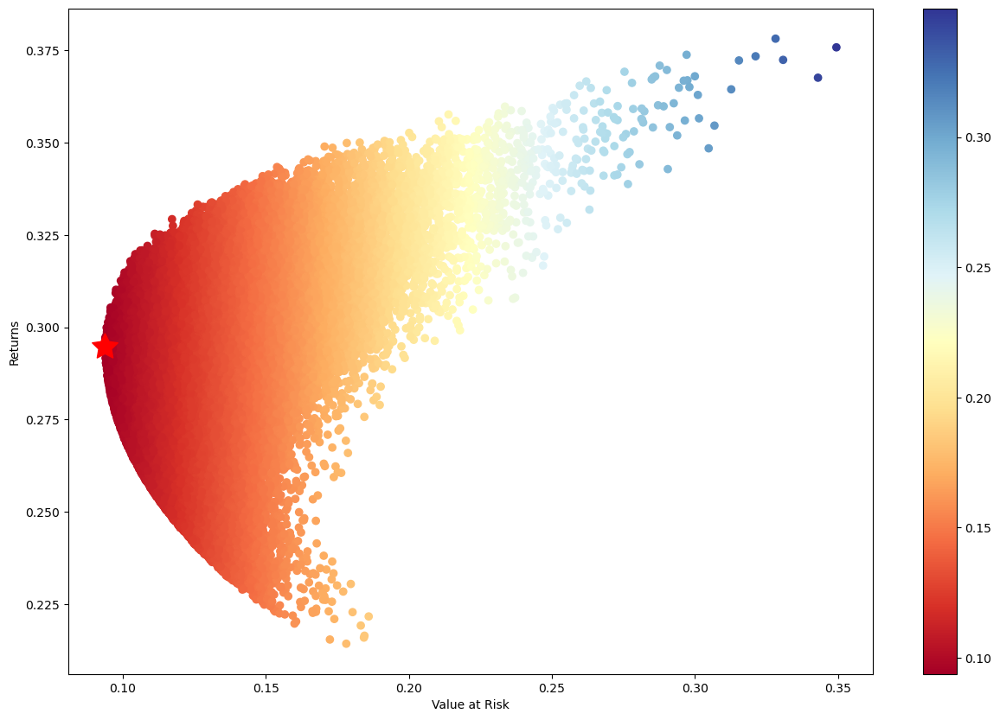

In [16]:
#locate positon of portfolio with minimum VaR
min_VaR_port = results_frame.iloc[results_frame['VaR'].idxmin()]
#create scatter plot coloured by VaR
plt.subplots(figsize=(15,10))
plt.scatter(results_frame.VaR,results_frame.ret,c=results_frame.VaR,cmap='RdYlBu')
plt.xlabel('Value at Risk')
plt.ylabel('Returns')
plt.colorbar()
#plot red star to highlight position of minimum VaR portfolio
plt.scatter(min_VaR_port[2],min_VaR_port[0],marker=(5,1,0),color='r',s=500)
plt.show()

In [17]:
constraints = ({'type': 'eq', 'fun': lambda x: np.sum(x) - 1})
def calc_portfolio_VaR(weights, mean_returns, cov, alpha, days):
    portfolio_return = np.sum(mean_returns * weights) * days
    portfolio_std = np.sqrt(np.dot(weights.T, np.dot(cov, weights))) * np.sqrt(days)
    portfolio_var = abs(portfolio_return - (portfolio_std * stats.norm.ppf(1 - alpha)))
    return portfolio_var
def min_VaR(mean_returns, cov, alpha, days):
    num_assets = len(mean_returns)
    args = (mean_returns, cov, alpha, days)
    constraints = ({'type': 'eq', 'fun': lambda x: np.sum(x) - 1})
    bound = (0.0,1.0)
    bounds = tuple(bound for asset in range(num_assets))
    result = sco.minimize(calc_portfolio_VaR, num_assets*[1./num_assets,],args=args,method='SLSQP', bounds=bounds, constraints=constraints)
    return result
min_port_VaR = min_VaR(mean_returns,cov,alpha,days)
print(pd.DataFrame([round(x,2) for x in min_port_VaR['x']],index=tickers).T.to_markdown(index=False))

|   AAPL |   MSFT |   NFLX |   AMZN |   GOOG |
|-------:|-------:|-------:|-------:|-------:|
|   0.43 |   0.24 |   0.12 |    0.2 |      0 |


In [18]:
import numpy as np
#list of stocks in portfolio
#NOTE THAT THESE MUST BE ENTERED IN ALPHABETICAL ORDER FOR THE RESULTS TO BE CORRECT!!!
stocks = ['AAPL', 'MSFT', 'NFLX', 'AMZN', 'GOOG']
#download daily price data for each of the stocks in the portfolio
#data = web.DataReader(stocks, data_source='yahoo',start='2010-01-01')['Adj Close']
data = pd.read_csv("./20091231-20220422-AdjClose_AaplMsftNflxAmznGoog.csv", index_col=0)
data.sort_index(inplace=True)
#convert daily stock prices into daily returns
returns = data.pct_change()
#calculate mean daily return and covariance of daily returns
mean_daily_returns = returns.mean()
cov_matrix = returns.cov()
#set array holding portfolio weights of each stock
weights = np.asarray([0.3,0.2,0.2,0.1,0.2])
#calculate annualised portfolio return
portfolio_return = round(np.sum(mean_daily_returns * weights) * 252,2)
#calculate annualised portfolio volatility
portfolio_std_dev = round(np.sqrt(np.dot(weights.T,np.dot(cov_matrix, weights))) * np.sqrt(252),2)
print('Portfolio expected annualised return is {} and volatility is {}'.format(portfolio_return,portfolio_std_dev))

Portfolio expected annualised return is 0.29 and volatility is 0.24


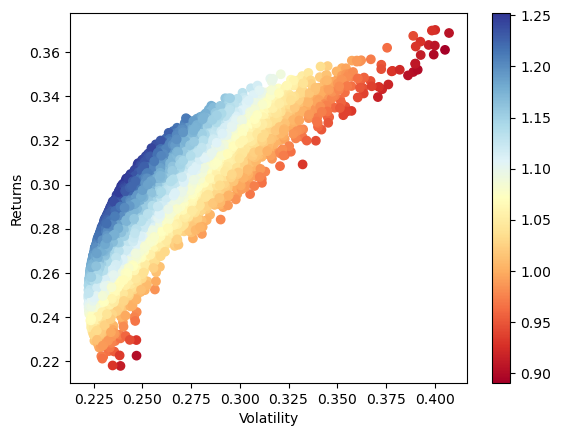

In [19]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
#list of stocks in portfolio
stocks = ['AAPL', 'MSFT', 'NFLX', 'AMZN', 'GOOG']
#download daily price data for each of the stocks in the portfolio
data = pd.read_csv("./20091231-20220422-AdjClose_AaplMsftNflxAmznGoog.csv", index_col=0)
data.sort_index(inplace=True)
#convert daily stock prices into daily returns
returns = data.pct_change()
#calculate mean daily return and covariance of daily returns
mean_daily_returns = returns.mean()
cov_matrix = returns.cov()
#set number of runs of random portfolio weights
num_portfolios = 25000
#set up array to hold results
results = np.zeros((3,num_portfolios))
for i in range(num_portfolios):
    #select random weights for portfolio holdings
    weights = np.random.random(5)
    #rebalance weights to sum to 1
    weights /= np.sum(weights)
    #calculate portfolio return and volatility
    portfolio_return = np.sum(mean_daily_returns * weights) * 252
    portfolio_std_dev = np.sqrt(np.dot(weights.T,np.dot(cov_matrix, weights))) * np.sqrt(252)
    #store results in results array
    results[0,i] = portfolio_return
    results[1,i] = portfolio_std_dev
    #store Sharpe Ratio (return / volatility) - risk free rate element excluded forsimplicity
    results[2,i] = results[0,i] / results[1,i]
#convert results array to Pandas DataFrame
results_frame = pd.DataFrame(results.T,columns=['ret','stdev','sharpe'])
#create scatter plot coloured by Sharpe Ratio
plt.scatter(results_frame.stdev,results_frame.ret,c=results_frame.sharpe,cmap='RdYlBu')
plt.xlabel('Volatility')
plt.ylabel('Returns')
plt.colorbar()

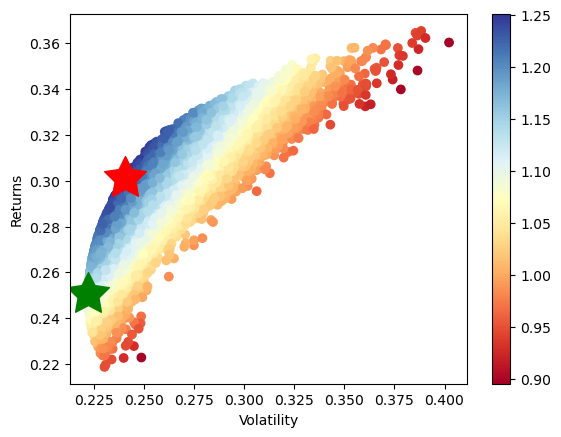

In [20]:
import numpy as np
import pandas as pd
import pandas_datareader.data as web
import matplotlib.pyplot as plt
#list of stocks in portfolio
stocks = ['AAPL', 'MSFT', 'NFLX', 'AMZN', 'GOOG']
#download daily price data for each of the stocks in the portfolio
data = pd.read_csv("./20091231-20220422-AdjClose_AaplMsftNflxAmznGoog.csv", index_col=0)
data.sort_index(inplace=True)
#convert daily stock prices into daily returns
returns = data.pct_change()
#calculate mean daily return and covariance of daily returns
mean_daily_returns = returns.mean()
cov_matrix = returns.cov()
#set number of runs of random portfolio weights
num_portfolios = 25000
#set up array to hold results
#We have increased the size of the array to hold the weight values for each stock
results = np.zeros((4+len(stocks)-1,num_portfolios))
for i in range(num_portfolios):
    #select random weights for portfolio holdings
    weights = np.array(np.random.random(5))
    #rebalance weights to sum to 1
    weights /= np.sum(weights)
    #calculate portfolio return and volatility
    portfolio_return = np.sum(mean_daily_returns * weights) * 252
    portfolio_std_dev = np.sqrt(np.dot(weights.T,np.dot(cov_matrix, weights))) *np.sqrt(252)
    #store results in results array
    results[0,i] = portfolio_return
    results[1,i] = portfolio_std_dev
    #store Sharpe Ratio (return / volatility) - risk free rate element excluded forsimplicity
    results[2,i] = results[0,i] / results[1,i]
    #iterate through the weight vector and add data to results array
    for j in range(len(weights)):
        results[j+3,i] = weights[j]
#convert results array to Pandas DataFrame
results_frame = pd.DataFrame(results.T,columns=['ret','stdev','sharpe',stocks[0],stocks[1],stocks[2],stocks[3],stocks[4]])
#locate position of portfolio with highest Sharpe Ratio
max_sharpe_port = results_frame.iloc[results_frame['sharpe'].idxmax()]
#locate positon of portfolio with minimum standard deviation
min_vol_port = results_frame.iloc[results_frame['stdev'].idxmin()]
#create scatter plot coloured by Sharpe Ratio
plt.scatter(results_frame.stdev,results_frame.ret,c=results_frame.sharpe,cmap='RdYlBu')
plt.xlabel('Volatility')
plt.ylabel('Returns')
plt.colorbar()
#plot red star to highlight position of portfolio with highest Sharpe Ratio
plt.scatter(max_sharpe_port[1],max_sharpe_port[0],marker=(5,1,0),color='r',s=1000)
#plot green star to highlight position of minimum variance portfolio
plt.scatter(min_vol_port[1],min_vol_port[0],marker=(5,1,0),color='g',s=1000)

In [21]:
print(max_sharpe_port.to_frame().T.to_markdown(index=False))

|     ret |    stdev |   sharpe |     AAPL |    MSFT |     NFLX |     AMZN |      GOOG |
|--------:|---------:|---------:|---------:|--------:|---------:|---------:|----------:|
| 0.30123 | 0.240837 |  1.25076 | 0.436591 | 0.19298 | 0.152144 | 0.198124 | 0.0201602 |


In [22]:
print(min_vol_port.to_frame().T.to_markdown(index=False))

|     ret |    stdev |   sharpe |     AAPL |     MSFT |      NFLX |      AMZN |     GOOG |
|--------:|---------:|---------:|---------:|---------:|----------:|----------:|---------:|
| 0.25059 | 0.222306 |  1.12723 | 0.259637 | 0.340675 | 0.0288431 | 0.0735802 | 0.297265 |
